<a href="https://colab.research.google.com/github/ibedoor/final-project-SDA/blob/main/impact_covid19_on_economy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##**Introduction**

---



The global pandemic has disrupted business activities worldwide. But COVID-19’s economic impact has varied across regions, and the consequences have been largely dependent on a region’s economic position.

As you’ll see, the data was collected with the specific focus of contrasting the pandemic’s effects on developing economies.

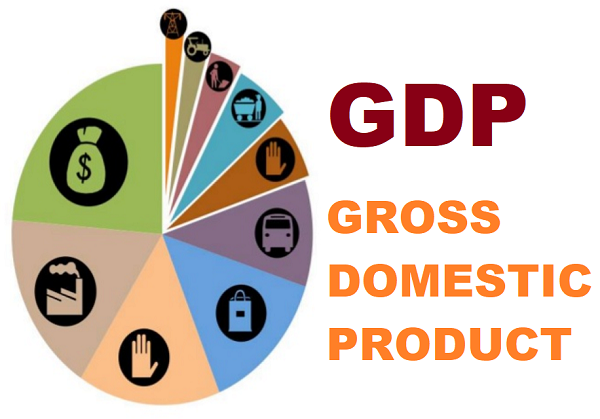

Data for 170 countries with respect to the impact of covid-19 on the global, including GDP Per Capita and Human Development Index.

**Data Dictionary:**
* **Code** - This column represents the ISO Codes given to a country. Each Country gets an ISO Code that can be of two forms - Alpha_2 and Alpha_3. We can use these codes to find the continent the country resides in.
* **Country** - This column contains the names of countries whose data has been mentioned.
* **Date** - Considering cases only till 19 October 2020, so the cases begin from 31 December 2019.
* **Population** - Shows the population of each country around the world.
* **GDPCAP** - Represents the GDP per Capita offered by a country. GDP is the Gross Domestic Product.
* **HDI** - Stands for Human Development Index. It is a measure of average achievement in key areas of human development. Higher the HDI, better chances of citizens surviving a COVID-19 pandemic.
* **TC** - Refers to Total Cases. Gives us the number of people affected by the COVID-19 pandemic.
* **TD** - Refers to Total Deaths. Gives us the number of people who died as a result of contracting the SARS-COV-2 virus.
* **STI** - Refers to how strict governments around the world became during the pandemic. Also refers to how stringent people became about following lockdown rules.

**Little information about target column:**\
GDP per capita acts as a metric for determining a country's economic output per each person living there. Often times, rich nations with smaller populations tend to have higher per capita GDP. Once you do the math, the wealth is spread among fewer people, which raises a country's GDP.

The fact that the GDP per capita divides a country's economic output by its total population makes it a good measurement of a country's standard of living, especially since it tells you how prosperous a country feels to each of its citizens.

In [1]:
# import libraries
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score
from sklearn.metrics import *
import plotly
from sklearn.metrics import mean_squared_error
import plotly.express as px
from plotly.offline import iplot
import plotly.figure_factory as ff
import matplotlib.dates as md
import plotly.graph_objects as go

Upload Data from Kaggle

In [2]:
# upload json file from files
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"bedooralharbi","key":"2782dd0819c3f551bae2c2aff522159b"}'}

In [3]:
# make directory
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
# change permission
!chmod 600 ~/.kaggle/kaggle.json

In [4]:
# put API data
!kaggle datasets download -d shashwatwork/impact-of-covid19-pandemic-on-the-global-economy

  0% 0.00/1.13M [00:00<?, ?B/s]
100% 1.13M/1.13M [00:00<00:00, 78.8MB/s]


Data Decompression

In [5]:
# unzip the data
!unzip \*.zip && rm *.zip

Archive:  impact-of-covid19-pandemic-on-the-global-economy.zip
  inflating: raw_data.csv            
  inflating: transformed_data.csv    


In [6]:
# read data
data = pd.read_csv('transformed_data.csv')

In [7]:
# put it into a pandas dataframe
df = pd.DataFrame(data)

##**Exploratory Data Analysis**





---



In this section, we will try to understand the data by `data table`, `shape`, `keys`, `describe`, and `info`. Moreover, we will do some visualizations for most important columns.

In [8]:
%load_ext google.colab.data_table

In [9]:
from google.colab import data_table
data_table.DataTable(df, include_index=False, num_rows_per_page=100)

,CODE,COUNTRY,DATE,HDI,TC,TD,STI,POP,GDPCAP
0,AFG,Afghanistan,2019-12-31,0.498,0.000000,0.000000,0.000000,17.477233,7.497754
1,AFG,Afghanistan,2020-01-01,0.498,0.000000,0.000000,0.000000,17.477233,7.497754
2,AFG,Afghanistan,2020-01-02,0.498,0.000000,0.000000,0.000000,17.477233,7.497754
3,AFG,Afghanistan,2020-01-03,0.498,0.000000,0.000000,0.000000,17.477233,7.497754
4,AFG,Afghanistan,2020-01-04,0.498,0.000000,0.000000,0.000000,17.477233,7.497754
...,...,...,...,...,...,...,...,...,...
50413,ZWE,Zimbabwe,2020-10-15,0.535,8.994048,5.442418,4.341855,16.514381,7.549491
50414,ZWE,Zimbabwe,2020-10-16,0.535,8.996528,5.442418,4.341855,16.514381,7.549491
50415,ZWE,Zimbabwe,2020-10-17,0.535,8.999496,5.442418,4.341855,16.514381,7.549491
50416,ZWE,Zimbabwe,2020-10-18,0.535,9.000853,5.442418,4.341855,16.514381,7.549491


In [10]:
# how many rows and columns we have?
df.shape

(50418, 9)

In [11]:
# load keys from data
df.keys()

Index(['CODE', 'COUNTRY', 'DATE', 'HDI', 'TC', 'TD', 'STI', 'POP', 'GDPCAP'], dtype='object')

In [12]:
# describe the data
df.describe

<bound method NDFrame.describe of       CODE      COUNTRY        DATE  ...       STI        POP    GDPCAP
0      AFG  Afghanistan  2019-12-31  ...  0.000000  17.477233  7.497754
1      AFG  Afghanistan  2020-01-01  ...  0.000000  17.477233  7.497754
2      AFG  Afghanistan  2020-01-02  ...  0.000000  17.477233  7.497754
3      AFG  Afghanistan  2020-01-03  ...  0.000000  17.477233  7.497754
4      AFG  Afghanistan  2020-01-04  ...  0.000000  17.477233  7.497754
...    ...          ...         ...  ...       ...        ...       ...
50413  ZWE     Zimbabwe  2020-10-15  ...  4.341855  16.514381  7.549491
50414  ZWE     Zimbabwe  2020-10-16  ...  4.341855  16.514381  7.549491
50415  ZWE     Zimbabwe  2020-10-17  ...  4.341855  16.514381  7.549491
50416  ZWE     Zimbabwe  2020-10-18  ...  4.341855  16.514381  7.549491
50417  ZWE     Zimbabwe  2020-10-19  ...  4.341855  16.514381  7.549491

[50418 rows x 9 columns]>

In [13]:
# info about our data
df.info

<bound method DataFrame.info of       CODE      COUNTRY        DATE  ...       STI        POP    GDPCAP
0      AFG  Afghanistan  2019-12-31  ...  0.000000  17.477233  7.497754
1      AFG  Afghanistan  2020-01-01  ...  0.000000  17.477233  7.497754
2      AFG  Afghanistan  2020-01-02  ...  0.000000  17.477233  7.497754
3      AFG  Afghanistan  2020-01-03  ...  0.000000  17.477233  7.497754
4      AFG  Afghanistan  2020-01-04  ...  0.000000  17.477233  7.497754
...    ...          ...         ...  ...       ...        ...       ...
50413  ZWE     Zimbabwe  2020-10-15  ...  4.341855  16.514381  7.549491
50414  ZWE     Zimbabwe  2020-10-16  ...  4.341855  16.514381  7.549491
50415  ZWE     Zimbabwe  2020-10-17  ...  4.341855  16.514381  7.549491
50416  ZWE     Zimbabwe  2020-10-18  ...  4.341855  16.514381  7.549491
50417  ZWE     Zimbabwe  2020-10-19  ...  4.341855  16.514381  7.549491

[50418 rows x 9 columns]>

### **Visualization**

---



####**Chart 1:** Heatmap chart about the data to extract relationship between columns

In [14]:
# correleation 
corrs = df.corr()
figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=corrs.round(2).values,
    showscale = True, colorscale=px.colors.qualitative.Pastel1_r)
# title
figure.update_layout(title_text='Correlation Heatmap')
# display the figure 
figure.show()

As we seen above, heatmap shows the most popular (hot) and unpopular (cold) elements of a webpage using colors on a scale from purple to light red.

####**Chart 2:** Line about Total cases and Deaths in Countries

In [15]:
# calculate total cases for all countries
total_cases = df.groupby(['COUNTRY']).TC.sum()

In [16]:
# calculate total deaths for all countries
total_deaths = df.groupby(['COUNTRY']).TD.sum()

In [17]:
# rename x and y labels
layout = go.Layout(xaxis = {'title':'Date'}, yaxis = {'title':'Total'})
fig = go.Figure(layout = layout)
# add traces
fig.add_trace(go.Scatter(x = df.DATE[:210], y = total_cases,
                    mode = 'lines',
                    name = 'Total Cases',
                    line = dict(
                        color = 'lightblue')))
fig.add_trace(go.Scatter(x = df.DATE[:210], y = total_deaths,
                    mode = 'lines',
                    name = 'Death Cases',
                    line = dict(
                        color = 'LightCoral'),
                    visible='legendonly'))
# title
fig.update_layout(title='Total Cases and Deaths of All Countries', showlegend=True)

# display figure
fig.show()

As we seen above, line shows total cases and deaths experiencing inconsistent high and low changes that are not constant and therefore are considered to be volatile.

#### **Chart 3:** Pie chart about the countries that had the highest `STI` 

In [18]:
# sum STI by Country names
highest_STI = df.groupby(['COUNTRY']).STI.sum()

In [19]:
# countries who have highest STI
highest_STI = highest_STI[highest_STI > 1000]

In [20]:
# display chart
px.pie(values = highest_STI, names = highest_STI.index, 
       title='Countries most willing to following the rules of a pandemic',
       color_discrete_map=px.colors.qualitative.Pastel2_r)

As we seen above, Pie shows for Countries most willing to following the rules of a pandemic we found **China** has the highest `STI`.

####**Chart 4:** Histogram chart about the Countries that had the highest `HDI`

In [21]:
hdi_sorted = df.sort_values(by='HDI', ascending=False)[:7000]
fig = px.histogram(y=hdi_sorted.COUNTRY, x=hdi_sorted.HDI, labels = {'y': 'Count', 'x': 'HDI'},
             color = df.COUNTRY[:7000],
             title='Countries whose citizens have more chances of surviving a COVID-19 pandemic', color_discrete_sequence=px.colors.qualitative.T10)
# display chart
fig.show()

As we seen above, histogram shows for Countries who have the highest `HDI` for first 7000 rows, we found **Afghanistan** has more chances of surviving a Covid-19 pandemic than other countries.

####**Chart 5:** Bar chart about the population of all countries

In [22]:
# sum POP by Country names
highest_pop = df.groupby(['COUNTRY']).POP.sum()

In [23]:
# display chart
px.bar(x = highest_pop.index, y = highest_pop, title='Distribution of Country and Population',
       labels = {'y': 'Population', 'x': 'Country'}, color_discrete_sequence = px.colors.qualitative.Pastel)

As we seen above, bar shows for countries who have the highest `POP` we found **China** has the highest `POP` by `6,199.707`.

####**Chart 6:** Map chart about the GPD of all countries

In [24]:
# display chart
px.choropleth(df, locationmode='ISO-3', locations='CODE',
              hover_name='COUNTRY',hover_data=['TC','TD','STI','POP'],
              animation_frame='DATE', projection= 'natural earth', 
              title='Gross Domestic Product for Countries', color_continuous_scale = px.colors.qualitative.Set2_r, 
              color='GDPCAP')

As we seen above, map shows all countries to see `GDPCAP` of each country we found at 2019-12-31 Norway has the highest `GDPCAP` by `11.07` and at 2020-10-19 Brunei has the highest `GDPCAP` by `11.18`.

##**Data Wrangling**

---



In this section, we will cleaning, structuring and enriching raw data into a desired format for better decision making in less time. Our stpes it will be:
* Convert `DATE` column from Object to datetime
* Check missing values
* Check outliers in columns who have missing values then fill missing values
* Prepare the data for model by split to train and test


###Convert `DATE` column

In [25]:
# convert column DATE from object to datetime
df['DATE'] = pd.to_datetime(df['DATE'])

In [26]:
# take date after 2019
df = df[df['DATE']> '2019']

In [27]:
# split date column by month
df['MONTH'] = df.DATE.dt.month

###Check missing values

In [28]:
# check if there are any missing values in the dataset
df.isnull().sum()

CODE          0
COUNTRY       0
DATE          0
HDI        6202
TC            0
TD            0
STI           0
POP           0
GDPCAP        0
MONTH         0
dtype: int64

###Check outliers in `HDI` column

In [29]:
# diplay chart
px.box(df, y='HDI', title='Outliers in HDI', color_discrete_sequence=px.colors.qualitative.Pastel)

As we seen above, visualize box shows outliers in `HDI` we found some outliers at `0`. In my opinion the most appropriate solution in not to drop missing values in the column, so we will fill it by median.

###Fill missing values in `HDI` column

In [30]:
# fill missing values in df here we have missing values in HDI column just
df['HDI'].fillna(df['HDI'].median(), inplace=True)

In [31]:
# check if there are any missing values in the dataset
df.isnull().sum()

CODE       0
COUNTRY    0
DATE       0
HDI        0
TC         0
TD         0
STI        0
POP        0
GDPCAP     0
MONTH      0
dtype: int64

Check the object columns

In [32]:
# check how many object column we have
cat_col = [col for col in df.columns if df[col].dtype=='O']
cat_col

['CODE', 'COUNTRY']

In [33]:
categorical = df[cat_col]

Drop the columns we don't need

In [34]:
# drop CODE column before get_dummies
categorical = categorical.drop('CODE', axis=1)

Convert categorical variable into dummy/indicator variables

In [35]:
categorical_dum = pd.get_dummies(categorical)

Append columns from one dataframe to another

In [36]:
df_new = pd.concat(
    [df,
     categorical_dum],
      axis=1)
df_new

,CODE,COUNTRY,DATE,HDI,TC,TD,STI,POP,GDPCAP,MONTH,COUNTRY_Afghanistan,COUNTRY_Albania,COUNTRY_Algeria,COUNTRY_Andorra,COUNTRY_Angola,COUNTRY_Anguilla,COUNTRY_Antigua and Barbuda,COUNTRY_Argentina,COUNTRY_Armenia,COUNTRY_Aruba,COUNTRY_Australia,COUNTRY_Austria,COUNTRY_Azerbaijan,COUNTRY_Bahamas,COUNTRY_Bahrain,COUNTRY_Bangladesh,COUNTRY_Barbados,COUNTRY_Belarus,COUNTRY_Belgium,COUNTRY_Belize,COUNTRY_Benin,COUNTRY_Bermuda,COUNTRY_Bhutan,COUNTRY_Bolivia,COUNTRY_Bonaire Sint Eustatius and Saba,COUNTRY_Bosnia and Herzegovina,COUNTRY_Botswana,COUNTRY_Brazil,COUNTRY_British Virgin Islands,COUNTRY_Brunei,...,COUNTRY_Sint Maarten (Dutch part),COUNTRY_Slovakia,COUNTRY_Slovenia,COUNTRY_Solomon Islands,COUNTRY_Somalia,COUNTRY_South Africa,COUNTRY_South Korea,COUNTRY_South Sudan,COUNTRY_Spain,COUNTRY_Sri Lanka,COUNTRY_Sudan,COUNTRY_Suriname,COUNTRY_Swaziland,COUNTRY_Sweden,COUNTRY_Switzerland,COUNTRY_Syria,COUNTRY_Taiwan,COUNTRY_Tajikistan,COUNTRY_Tanzania,COUNTRY_Thailand,COUNTRY_Timor,COUNTRY_Togo,COUNTRY_Trinidad and Tobago,COUNTRY_Tunisia,COUNTRY_Turkey,COUNTRY_Turks and Caicos Islands,COUNTRY_Uganda,COUNTRY_Ukraine,COUNTRY_United Arab Emirates,COUNTRY_United Kingdom,COUNTRY_United States,COUNTRY_United States Virgin Islands,COUNTRY_Uruguay,COUNTRY_Uzbekistan,COUNTRY_Vatican,COUNTRY_Venezuela,COUNTRY_Vietnam,COUNTRY_Yemen,COUNTRY_Zambia,COUNTRY_Zimbabwe
0,AFG,Afghanistan,2019-12-31,0.498,0.000000,0.000000,0.000000,17.477233,7.497754,12,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,AFG,Afghanistan,2020-01-01,0.498,0.000000,0.000000,0.000000,17.477233,7.497754,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,AFG,Afghanistan,2020-01-02,0.498,0.000000,0.000000,0.000000,17.477233,7.497754,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,AFG,Afghanistan,2020-01-03,0.498,0.000000,0.000000,0.000000,17.477233,7.497754,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,AFG,Afghanistan,2020-01-04,0.498,0.000000,0.000000,0.000000,17.477233,7.497754,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50413,ZWE,Zimbabwe,2020-10-15,0.535,8.994048,5.442418,4.341855,16.514381,7.549491,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
50414,ZWE,Zimbabwe,2020-10-16,0.535,8.996528,5.442418,4.341855,16.514381,7.549491,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
50415,ZWE,Zimbabwe,2020-10-17,0.535,8.999496,5.442418,4.341855,16.514381,7.549491,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
50416,ZWE,Zimbabwe,2020-10-18,0.535,9.000853,5.442418,4.341855,16.514381,7.549491,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


Drop the categorical columns

In [37]:
# drop categorical columns
df_new.drop(['CODE',
 'COUNTRY'], axis=1, inplace=True)

### **Split Dataset**

In [38]:
# split data by month
train = df_new[df_new['MONTH'] < 10]
test = df_new[df_new['MONTH'] >= 10]

In [39]:
# split the data
X_train = train.drop(['GDPCAP','DATE'],axis=1)
y_train = train['GDPCAP']
X_test = test.drop(['GDPCAP', 'DATE'],  axis=1)
y_test = test['GDPCAP']

Print shape of data after split

In [40]:
print('Shape of X_train:',X_train.shape)
print('Shape of X_test:',X_test.shape)
print('Shape of y_train:',y_train.shape)
print('Shape of y_test:',y_test.shape)

Shape of X_train: (46389, 216)
Shape of X_test: (4029, 216)
Shape of y_train: (46389,)
Shape of y_test: (4029,)


Verfiy from duplicated values

In [41]:
# check if there is any duplication in the data
df_new.duplicated().sum()

0

##**Models**

---





In this section, we will use some regression models fit the data we have because it is contains continues values. Regression analysis consists of a set of machine learning methods that allow us to predict a continuous outcome variable based on the value of one or multiple predictor variables.

### **Model 1:** Baseline

A baseline is a model that is both simple to set up and has a reasonable chance of providing decent results. Experimenting with them is usually quick and low cost, since implementations are widely available in popular packages.

In [42]:
# baselie model
baseline = df['GDPCAP'].value_counts(normalize=True)[0]
print("Baseline score is: {:.2f}".format(baseline))

Baseline score is: 0.11


### **Model 2:** Linear Regression

Linear regression is a basic and commonly used type of predictive analysis. Linear regression attempts to model the relationship between two variables by fitting a linear equation to observed data. One variable is considered to be an explanatory variable, and the other is considered to be a dependent variable.Three major uses for regression analysis are:
* Determining the strength of predictors
* Forecasting an effect
* Trend forecasting

In [43]:
# import and make a simple linear regression model
from sklearn.linear_model import LinearRegression

# create a regressor object 
lr = LinearRegression(fit_intercept=True, normalize=False)

# fit the regressor with X_train and y_train data 
lr.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [44]:
# predictions for Linear Regressor model
lr_preds = lr.predict(X_test)
lr_preds

array([7.49775449, 7.49775449, 7.49775449, ..., 7.54949074, 7.54949074,
       7.54949074])

In [45]:
# print the coefficients
print(lr.intercept_)
print(lr.coef_)

-5.067187596815595
[ 4.86727178e+00 -1.55084279e-14  1.56263891e-14  6.21724894e-15
  6.55912963e-01  6.21724894e-15 -1.32250299e+00  8.67435195e-01
 -6.03743294e-01 -6.49122959e+00 -4.44242153e-01 -4.90021969e+00
  3.70835872e+00 -6.61061159e-01  6.99213638e-01  4.30312564e+00
  1.73395141e-02  8.68353144e-01  4.72291193e-01  2.91953188e+00
  2.21474001e+00 -2.13435854e+00  2.66918653e+00  3.50317029e-01
  6.00919205e-01  2.12930386e+00 -5.05296451e-01  4.99926604e+00
  2.26877160e+00 -1.42145829e-01 -5.26646646e+00  8.56596576e-01
  1.62293760e+00 -1.64985214e+00 -5.35993781e+00  3.57765558e+00
  6.05766338e-01 -6.07147997e-01 -1.09386863e+00 -4.73613948e-01
 -7.30282648e-01 -1.90808050e-01  1.94318164e+00  4.94868970e+00
 -3.19686906e-01 -3.19078379e-01  7.88393458e-05 -2.78834817e+00
 -7.15738044e-01  9.02926685e-01  4.28716584e-01  7.23125383e-01
 -3.46815947e-01  1.06317421e+00 -9.36845769e+00 -6.46935533e+00
  2.24904801e+00  5.20302555e-01 -2.47248064e+00  1.08272517e+00
  1.59

In [46]:
# score for Linear Regressor model
lr_score = r2_score(y_true=y_test, y_pred=lr_preds)
print("Linear Regressor score is: {:.2f}%".format(lr_score*100))

Linear Regressor score is: 99.98%


In [47]:
# mean squared error for Linear Regressor model
lr_mse = mean_squared_error(y_test, lr_preds)
print("Mean squared error for Linear Regressor model: %.2f" % lr_mse)

Mean squared error for Linear Regressor model: 0.00


####Comparison between actual and predicted data

In [48]:
pd.DataFrame({'Actual':y_test, 'Predicted':lr_preds})

,Actual,Predicted
0,7.497754,7.497754
275,7.497754,7.497754
276,7.497754,7.497754
277,7.497754,7.497754
278,7.497754,7.497754
...,...,...
50413,7.549491,7.549491
50414,7.549491,7.549491
50415,7.549491,7.549491
50416,7.549491,7.549491


###**Model 3:** Decision Tree Regression

Decision Tree is a decision-making tool that uses a flowchart-like tree structure or is a model of decisions and all of their possible results, including outcomes, input costs and utility.
Decision-tree algorithm falls under the category of supervised learning algorithms. It works for both continuous as well as categorical output variables.

In [49]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor  

# create a regressor object 
dtr = DecisionTreeRegressor(random_state = 0)  
  
# fit the regressor with X_train and y_train data 
dtr.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [50]:
# predictions for Decision Tree Regressor model
dtr_preds = dtr.predict(X_test)
dtr_preds

array([7.49775449, 7.49775449, 7.49775449, ..., 7.54949074, 7.54949074,
       7.54949074])

In [51]:
# score for Decision Tree Regressor model
dtr_score = r2_score(y_test, dtr_preds)
print("Decision Tree Regressor score is: {:.2f}%".format(dtr_score*100))

Decision Tree Regressor score is: 100.00%


In [52]:
# mean squared error for Decision Tree Regressor model
dtr_mse = mean_squared_error(y_test, dtr_preds)
print("Mean squared error for Decision Tree Regressor model is: %.2f" % dtr_mse)

Mean squared error for Decision Tree Regressor model is: 0.00


####Comparison between actual and predicted data

In [53]:
pd.DataFrame({'Actual':y_test, 'Predicted':dtr_preds})

,Actual,Predicted
0,7.497754,7.497754
275,7.497754,7.497754
276,7.497754,7.497754
277,7.497754,7.497754
278,7.497754,7.497754
...,...,...
50413,7.549491,7.549491
50414,7.549491,7.549491
50415,7.549491,7.549491
50416,7.549491,7.549491


### **Model 4:** XGBoost Regressor

XGBoost is a powerful approach for building supervised regression models. The validity of this statement can be inferred by knowing about its (XGBoost) objective function and base learners.

In [54]:
# import and make a simple XGB regressor model
from xgboost import XGBRegressor

# create a regressor object 
xgbr = XGBRegressor(random_state=14)

# fit the regressor with X_train and y_train data 
xgbr.fit(pd.DataFrame(X_train), y_train)

[19:48:20] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=14,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [55]:
# predictions for XGB Regressor model
xgbr_preds = xgbr.predict(pd.DataFrame(X_test))
xgbr_preds

array([7.7464375, 7.7464375, 7.7464375, ..., 7.7464375, 7.7464375,
       7.7464375], dtype=float32)

In [56]:
# socre for XGB Regressor model
xgbr_score = r2_score(y_test, xgbr_preds)
print("XGB Regressor score is: {:.2f}%".format(xgbr_score*100))

XGB Regressor score is: 95.54%


In [57]:
# mean squared error for XGB Regressor model
xgbr_mse = mean_squared_error(y_test, xgbr_preds)
print("Mean squared error for XGB Regressor model is: %.2f" % xgbr_mse)

Mean squared error for XGB Regressor model is: 0.47


####Comparison between actual and predicted data

In [58]:
pd.DataFrame({'Actual':y_test, 'Predicted':xgbr_preds})

,Actual,Predicted
0,7.497754,7.746438
275,7.497754,7.746438
276,7.497754,7.746438
277,7.497754,7.746438
278,7.497754,7.746438
...,...,...
50413,7.549491,7.746438
50414,7.549491,7.746438
50415,7.549491,7.746438
50416,7.549491,7.746438


### **Model 5:** Random Forest Regressor

Random Forest Regression is a supervised learning algorithm that uses ensemble learning method for regression. Ensemble learning method is a technique that combines predictions from multiple machine learning algorithms to make a more accurate prediction than a single model.

In [59]:
# import and make a simple Random Forest model
from sklearn.ensemble import RandomForestRegressor

# create a regressor object 
rfr = RandomForestRegressor(n_estimators = 1000, random_state = 42)

# fit the regressor with X_train and y_train data 
rfr.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=1000, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [60]:
# predictions for Random Forest Regressor model
rfr_preds = rfr.predict(X_test)
rfr_preds

array([7.49775449, 7.49775449, 7.49775449, ..., 7.54949074, 7.54949074,
       7.54949074])

In [61]:
# score for Random Forest Regressor model
rfr_score = r2_score(y_test, rfr_preds)
print("Random Forest Regressor score is: {:.2f}%".format(rfr_score*100))

Random Forest Regressor score is: 99.66%


In [62]:
# mean squared error for Random Forest Regressor model
rfr_mse = mean_squared_error(y_test, rfr_preds)
print("Mean squared error for Random Forest Regressor model is: %.2f" % rfr_mse)

Mean squared error for Random Forest Regressor model is: 0.04


####Comparison between actual and predicted data on several feature names

In [63]:
pd.DataFrame({'Actual':y_test, 'Predicted':rfr_preds})

,Actual,Predicted
0,7.497754,7.497754
275,7.497754,7.497754
276,7.497754,7.497754
277,7.497754,7.497754
278,7.497754,7.497754
...,...,...
50413,7.549491,7.549491
50414,7.549491,7.549491
50415,7.549491,7.549491
50416,7.549491,7.549491


####**Feature importance:**

Feature importance is calculated as the decrease in node impurity weighted by the probability of reaching that node. The node probability can be calculated by the number of samples that reach the node, divided by the total number of samples. The higher the value the more important the feature.

#####Feature importance in Decision Tree Regression model

In [64]:
feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(df_new.columns, dtr.feature_importances_):
    feats[feature] = importance #add the name/value pair 

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})

In [65]:
# display chart
px.bar(importances, x = importances.index, y = 'Gini-importance', title = 'Feature Importance'
             , color_discrete_sequence=px.colors.qualitative.Pastel, labels={'x': 'Column Names'})

As we seen above, bar chart give us features importance in Decision Tree Regression as follows: `DATE`, `STI`, `COUNTRY_Switzerland`, `COUNTRY_Saint Lucia`, `COUNTRY_Sierra Leono`

#####Feature importance in XGBoost Regression model

In [66]:
feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(df_new.columns, xgbr.feature_importances_):
    feats[feature] = importance #add the name/value pair 

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})

In [67]:
# display chart
px.bar(importances, x = importances.index, y = 'Gini-importance', title = 'Feature Importance'
             , color_discrete_sequence=px.colors.qualitative.Pastel, labels={'x': 'Column Names'})

As we seen above, bar chart give us features importance in XGBoost Regression as follows: `DATE`, `STI`, `COUNTRY_Switzerland`, `COUNTRY_Saint Lucia`, `TC`

#####Feature importance in Random Forest Regression model

In [68]:
feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(df_new.columns, rfr.feature_importances_):
    feats[feature] = importance #add the name/value pair 

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})

In [69]:
# display chart
px.bar(importances, x = importances.index, y = 'Gini-importance', title = 'Feature Importance'
    , color_discrete_sequence=px.colors.qualitative.Pastel, labels={'x': 'Column Names'})

As we seen above, bar chart give us features importance in Random Forest Regression as follows: `DATE`, `STI`, `COUNTRY_Switzerland`, `COUNTRY_Saint Lucia`, `COUNTRY_Sierra Leono`

##**Conclusion:**

---



To conclude, we obtain LinearRgression, DecisionTreeRegression, XGBoostRegression, and RandomForestRegression recorded score with **99.98%**, **100%**, **95.54%**, and **99.66%**. As for mean squared error we found that: LinearRgression got **0.00** , DecisionTreeRegression **0.00**, XGBoostRegression **0.47**, and RandomForestRegression **0.04**.

To compare the models with the Baseline, we illustrate that, Baseline got the lowest score with **11%**.

Finally, Based on our results that appeared to us, it becomes clear to us that DecisionTreeRegression is the best model that gave us the highest score without mean squared error.

Some tips to increase GDP during Covid-19 pandemic:
* Helping people cope with adversity, through social protection and basic services
* Protecting jobs, supporting small and medium-sized enterprises, and informal sector workers through economic response and recovery programmes
* Guiding the necessary surge in fiscal and financial stimulus to make macroeconomic policies work for the most vulnerable and strengthening multilateral and regional responses
* Promoting social cohesion and investing in community-led resilience and response systems
